# Mapping Evapotransportation Under Current and Future Climate Models 

## Abstract
The evapotranspiration process is key to understanding crop water demands. Using the established FAO-56 method for assessing baseline values using a reference crop. We can use climatic variables to asses changes in irrigation demands. Values needed for establishing baseline (ET$_0$), come from the historical values in WorldClim 2.1. Those values can then be used to build and quantify the performance of a random forest model using the subset of variables that are in future climate models in order to predict changes in ET$_0$ under future climate models. 

## Introduction
Evapotranspiration is the sum of process by which water goes from the surface to the atmosphere via Evaporation out of the soil and transportation in which is water moving through plants to the atmosphere. This process is key to understanding the water needs of the agricultural industry and there are many proposed methods for its approximation. The first to see widespread adoption being the Penman equation. Established in 1948, it combined radiative energy balance with aerodynamic mass transfer methods to produce a approach that didn't require surface temperature. In 1998 a simplified equation was proposed by the Food and Agriculture Organization of the United Nations in FAO-56 were they established the Penman-Montheith equation a reference grass crop to simplify the equation to climatic variables and allow for comparison of different climates. Further methods have been developed as well as novel techniques like the use of thermal satellite imagery for more accurate results on the geographic scale. 

### FAO-56
Established an equation for Reference evapotranspiration, Explaining the need for a reference crop in order to make comparisons, analyzed different methods and issues with variability in their results. Then establishes the baseline crop that is still widely used today. 

### Practical and Theoretical Benefits of an Alternative to the Penman-Monteith Evapotranspiration Equation
As with any standard their are some critiques this paper highlights some issues with the performance of the Penman-Montheith equation under limiting cases that effect results at night and in cold environments. Though interesting their methods were not used due to complexity and not allowing for comparisons to other studies. 

### Version 3 of the Global Aridity Index and Potential Evapotranspiration Database
This work established methods for using WorldClim 2.0 data to calculate baseline values for evapotranspiration using the Penman-Monteith equation.  

### Projecting potential evapotranspiration change and quantifying its uncertainty under future climate scenarios: A case study in southeastern Australia
This paper compared the effectiveness of different methods using a simplified set of inputs comparing four other 0-models for ET$_0$ (Jensen-Haise, Makkink, Abtew, and Hargreaves) to a random forest model using the Penman-Monteith equation as a judge. Where they found random forest models to be more effective then alternatives.  

### Satellite-Based Energy Balance for Mapping Evapotranspiration with Internalized Calibration (METRIC)—Model
For a completely different approach, this papers proposes methods for using short and long wave satellite images from Landsat and MODIS along with ground based weather data in order to produce ET values and has other practical values over traditional methods. 




In [1]:
#Import our libraries

import numpy as np
import matplotlib.pyplot as plt

import pandas as pd
import geopandas as gpd


#Need for pretty colorbar:
from mpl_toolkits.axes_grid1 import make_axes_locatable


#Import our basic rasterio stuff
import rasterio
from rasterio.plot import show
import rasterio.mask

from rasterio.warp import calculate_default_transform, reproject, Resampling


#We'll also need xarray/rioxarray:
import xarray as xr
import rioxarray as rxr


from rasterio.features import geometry_mask

#
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics

import requests

import locale
from locale import atof
locale.setlocale(locale.LC_NUMERIC, '')

'en_US.UTF-8'

## Methods
### Data Sources 
Using values defined in FAO-56 standard for the Penman-Monteith equation gives standard values for the non climatic variables crop height, albedo, surface resistance. The rest of the variables come from climate models. In this case the climate data came from WorldClim v2.0 with historical data averaged over 1970-2000 to establish a baseline, and the future data being from the HadGEM3-GC31-LL climate model under SSP245 for years 2041-2060, in which only a subset of the climatic variables are provided, so a random forest regression model was used.

| **variable**                   | historical climate | HadGEM3-GC31-LL |
| ------------------------------ | ------------------ | --------------- |
| minimum temperature (°C)       | X                  | X               |
| maximum temperature (°C)       | X                  | X               |
| average temperature (°C)       | X                  |                 |
| precipitation (mm)             | X                  | X               |
| solar radiation (kJ m-2 day-1) | X                  |                 |
| wind speed (m s-1)             | X                  |                 |
| water vapor pressure (kPa)     | X                  |                 |

### Calculating ET$_0$ 
Calculating values of ET$_0$ was done using the methods in (Zomer et al., 2022) using a 12 cm grass reference crop,  which are as follows.

 $$ ET_o = \frac{0.408 \Delta (R_n-G) + \frac{900}{T_{avg}+273} * u_2 *(e_{s} - e_a) }{\Delta + \gamma \left( 1 + \frac{r_{s}}{r_{a}} \right)}$$

$ET_o$ = Reference Evapotranspiration, Water volume Evapotranspiration  
$\Delta$ = Slope of vapour pressure curve (kPa $\degree C^{-1}$)   
$R_n$ = Net irradiance (MJ m<sup>−2</sup> day<sup>−1</sup>)  
$G$ = Ground heat flux (MJ m<sup>−2</sup> day<sup>−1</sup>)   
$\gamma$ = Psychrometric constant   (kPa $\degree C^{-1}$)  
$e_s$ = the saturation vapor pressure (kPa)  
$e_a$ = actual vapour pressure (kPa)  
$e_{s}- e_{a}$ = the saturation vapour pressure deficit (kPa)  
$r_s$ = the bulk surface resistance (m s$^{-1}$)   
$r_a$ = the aerodynamic resistance (m s$^{-1}$)   


### Reference ET$_0$ Under Future Climate Models 
In order to attempt understanding how crop irrigation needs might change under future climate scenarios, and given only a subset of the required climatic variables, further estimations are needed. In order to reduce complexity, the data was first clipped to the CONUS using maps from the US Census. Where Random Forest Regression was used to build a model to predict values of ET$_0$ using values from the historical model that are available under the future climate model. This could then be applied and analysed. 

### Changes In Agricultural Areas
Data from USDA quick stats was used to acquire acres of harvested land in 2017. Which was used in conjunction with Census state and county maps to look at changes in counties where at least 25% of the land was harvested. 

In [2]:
#Declare some things that just might come in handy later 

sources = ['tmax', 'tmin', 'srad','vapr','wind','tavg','prec'] # declare our variables 
months = [str(month).zfill(2) for month in range(1, 13)] # define the months we would like ot look at (zfill gives leading zeros)

# create a month dict to get names for labels
month_names = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
month_dict = {month: name for month, name in zip(months, month_names)}

#create days per month dict for percipitation calculations
month_days = [31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31]
month_dict_days = {month: days for month, days in zip(months, month_days)}

In [3]:
#grab elevation
elev = rxr.open_rasterio('Data/wc2.1_2.5m_elev.tif', masked=True).squeeze()

In [4]:
## Load Data
scale = '2.5m'
#scale = '30s'

#load files into dict
data_dict = {}
for month in months:
    for source in sources:
        file_name = f'Data/wc2.1_{scale}_{source}_{month}.tif'
        data = rxr.open_rasterio(file_name, masked=True).squeeze()
        key = f'{source}_{month}'
        data_dict[key] = data

In [5]:
#Some more hyperparamets 

# albedo of surface vegetation [fraction of unit] - alb
alb = 0.23
# height of wind measurements [m]
zm = 2

# height of humidity measurements [m]
zh = 2

# crop height [m]
ht = 0.12

# atmospheric pressure [KPa]
Pr = 101.3 * (((293 - (0.0065 * elev)) / 293) ** 5.26)

# Psychrometric constant, [kPa C-1]
ga = (Pr * 0.001013) / (0.622 * 2.45)

# Specific Heat at Constant Pressure [MJ kg-1 C-1]
cp = (ga * 0.622 * 2.45) / Pr

# surface resistance [s m-1]
rs = 100 / (0.5 * 24 * ht)


In [6]:
# monthly worldwide ETO Calculations
ETo_data = {} 
delta_data = {}

i = 0 

for  month in months:

    tmax = data_dict[f'tmax_{month}']
    tmin = data_dict[f'tmin_{month}']
    srad = data_dict[f'srad_{month}']
    vapr = data_dict[f'vapr_{month}']
    wind = data_dict[f'wind_{month}']
    tavg = data_dict[f'tavg_{month}']
    prec = data_dict[f'prec_{month}']

    #Aerodynamic Resistance[s m - 1]
    ra_eq = np.log((zm - (ht * 2 / 3)) / (0.123 * ht)) * np.log((zh - (ht * 2 / 3)) / (0.0123 * ht)) / (0.41 * 0.41 * wind)

    # Mean Saturation Vapor Pressure[KPa]
    es_mint_eq = 0.6108 * np.exp((17.27 * tmin) / (tmin + 237.3))
    es_maxt_eq = 0.6108 * np.exp((17.27 * tmax) / (tmax + 237.3))
    
    es_mean = (es_mint_eq + es_maxt_eq) / 2
    es_maxt_eq = 0.6108 * np.exp((17.27 * tmax) / (tmax + 237.3))
    
    # Vapor Pressure Deficit[KPa]
    vpd_eq = es_mean - vapr

    # Slope of Saturation Vapor Pressure [kPa C - 1]
    delta_eq = (4098 * (0.6108 * np.exp((17.27 * tavg) / (tavg + 237.3)))) / ((tavg + 237.3) ** 2)

    # Mean Air Density at Constant Pressure[Kg m - 2]
    pa_eq = Pr / (1.01 * (tavg + 273) * 0.287)

    # Net Shortwave radiation at crop surface [MJ m-2 day-1] - Rns
    Rns_month = (1 - alb) * srad/1000
    
    # Clear-sky solar radiation [MJ m-2 day-1] - Rso
    Rso_month = (srad / 1e3)* (0.75 + (elev * 0.00002))#(ETsrad_dir_month / 0.408) * (0.75 + (elev * 0.00002))

    # Net longwave radiation at crop surface [MJ m-2 day-1] - Rns
    Rnl_month = 0.000000004903 * (((tmin**4) + (tmax**4)) / 2) * (0.34 - 0.14 * np.sqrt(vapr)) * ((1.35 * srad / Rso_month) - 0.35)

    # Rn - Net Radiation at the Crop Surface [kJ m-2 day-1] - Rn
    Rn_month = Rns_month - Rnl_month

    # PET[mm day -1]  average daily ETo
    pet_d_eq = ((0.408 * Rn_month * delta_eq) + (ga * 900 * wind * vpd_eq / (tavg + 273))) / (delta_eq + (ga * (1 + (rs / ra_eq))))


    # PET[mm mo - 1] average monthly ETo
    pet_m_eq = pet_d_eq * month_dict_days[month]

    # Store ETo and water loss 
    ETo_data[month] = pet_m_eq 
    

In [7]:
# Drop variables that are no longer needed
#del tmax, tmin, srad, vapr, wind, tavg, prec, ra_eq, es_mint_eq, es_maxt_eq, es_mean, vpd_eq, delta_eq, pa_eq, Rns_month, Rso_month, Rnl_month, Rn_month, pet_d_eq, pet_m_eq


In [8]:
#make yearly average (total)
for month in months:
    if month == '01':
        total = ETo_data[month]
    else:
        total = total + ETo_data[month]

# Results
Using the methods discussed above we can produce figures like the one below. Which maps cumulative values of ET$_0$ over the average year and gives insight into what areas are viable for agriculture. Note Antarctica is removed and values below zero have been clipped, these are predominantly polar and high elevation regions and don't effect growing regions, issues with the Penman-Monteith methods at these extremes are discussed in (McColl et all.,2020).

Text(0.5, 1.0, 'Potential Evapotranspiration')

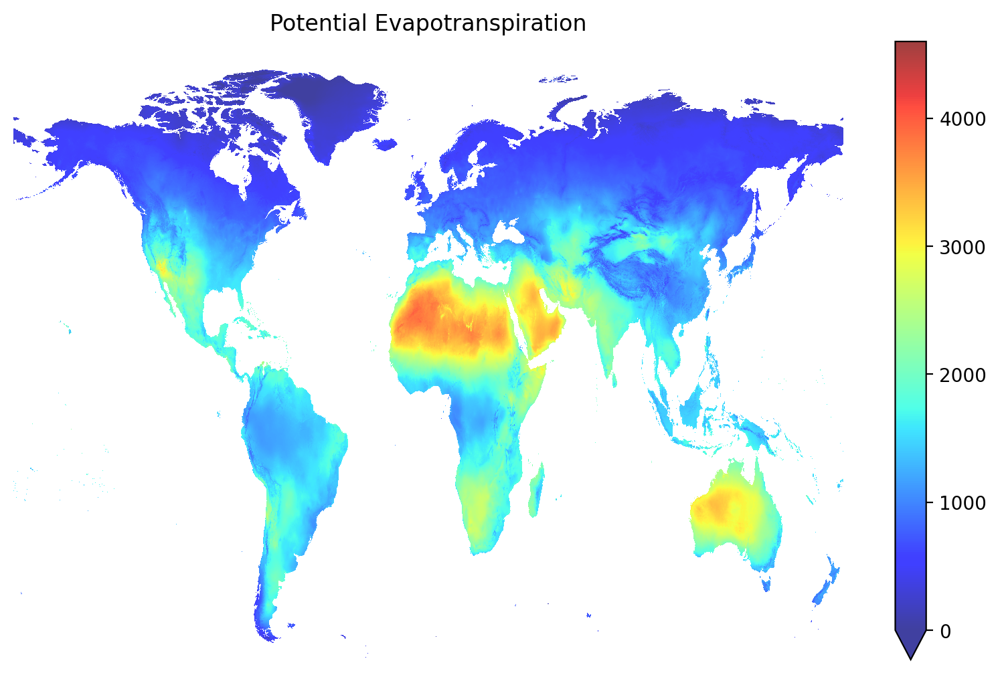

In [9]:
fig, ax1 = plt.subplots(1,1, figsize=(10, 6), dpi=200)

total.where(total.y > -60, drop=True).plot(cmap = 'jet',vmin = 0,vmax = 4600,alpha = 0.75)
ax1.set_axis_off()
ax1.set_title('Potential Evapotranspiration')

### Focusing on the Continental United States
Restricting our domain to the United States allows us to integrate more data sources extract more value from the data. This first figure highlights the seasonality one would expect out of ET$_0$ with weather off season months and increased aridity during the summer months. The difference between the arid west and the humid east can be seen. 

In [11]:
#Get shapefile data directly from census URLs
#########

#Load the counties
url_county = 'https://www2.census.gov/geo/tiger/GENZ2021/shp/cb_2021_us_county_500k.zip'
county_gdf = gpd.read_file(url_county)

#And the states:
url_county = 'https://www2.census.gov/geo/tiger/GENZ2021/shp/cb_2021_us_state_500k.zip'
state_gdf = gpd.read_file(url_county)


#Exclude everthing outside the contiguous US:
exclude_list = [15, 72, 2, 60, 66, 69, 78]
county_gdf = county_gdf.loc[~county_gdf['STATEFP'].astype(int).isin(exclude_list)]
state_gdf = state_gdf.loc[~state_gdf['STATEFP'].astype(int).isin(exclude_list)]


#And convert to CRS EPSG:4326:
county_gdf = county_gdf.to_crs(4326) 
state_gdf = state_gdf.to_crs(4326)


#Throw in a FIPS code for the county_gdf:
county_gdf['FIPS'] = county_gdf.STATEFP + county_gdf.COUNTYFP

#A quick plot to check:
#####
if 1 < 0:
    fig, ax1 = plt.subplots(1, 2, figsize=(12, 8), dpi=300)
    
    county_gdf.plot(ax = ax1[0], linewidth = .1, edgecolor = 'black', facecolor='none')
    state_gdf.plot(ax = ax1[1], linewidth = .5, edgecolor = 'black', facecolor='none')
    
    ax1[0].set_title('Counties', fontweight='bold');
    ax1[1].set_title('States', fontweight='bold');
    ax1[0].set_axis_off()
    ax1[1].set_axis_off()
    
    plt.subplots_adjust(wspace=0.05) 

In [12]:
#load and crop to Conus
scale = '2.5m'
conus_data_dict = {}
for month in months:
    for source in sources:
        file_name = f'Data/wc2.1_{scale}_{source}_{month}.tif'
        data = rxr.open_rasterio(file_name, masked=True).squeeze()
        key = f'{source}_{month}'
        
        # Extract dimensions from dataset.sizes
        height = data.sizes['y']
        width = data.sizes['x']

        #clip first
        data = data.rio.clip(state_gdf.geometry.values, state_gdf.crs)  
        #reproject
        data = data.rio.reproject('EPSG:5070')
        
        #save
        conus_data_dict[key] = data

#reproject our census maps data as well 
county_gdf_5070 = county_gdf.to_crs(5070)
state_gdf_5070 = state_gdf.to_crs(5070)

In [13]:
#can't forget elevation
elev = elev.rio.clip(state_gdf.geometry.values, state_gdf.crs)  
elev = elev.rio.reproject('EPSG:5070')

In [14]:
#Redeclare Some more hyperparamets (needed becuase of use of elevaton data)

# albedo of surface vegetation [fraction of unit] - alb
alb = 0.23
# height of wind measurements [m]
zm = 2

# height of humidity measurements [m]
zh = 2

# crop height [m]
ht = 0.12

# atmospheric pressure [KPa]
Pr = 101.3 * (((293 - (0.0065 * elev)) / 293) ** 5.26)

# Psychrometric constant, [kPa C-1]
ga = (Pr * 0.001013) / (0.622 * 2.45)

# Specific Heat at Constant Pressure [MJ kg-1 C-1]
cp = (ga * 0.622 * 2.45) / Pr

# surface resistance [s m-1]
rs = 100 / (0.5 * 24 * ht)


In [15]:
# calculate ETo use methods discribed in Version 3 of the Global Aridity Index and Potential Evapotranspiration Database
conus_ETo_data = {} 
conus_delta_data = {}
consu_ai = {}
y_data = pd.DataFrame()
x_data = pd.DataFrame()

monthly_data = pd.Series()
i = 0 
for month in months:
    tmax = conus_data_dict[f'tmax_{month}'] 
    tmin = conus_data_dict[f'tmin_{month}'] 
    srad = conus_data_dict[f'srad_{month}']
    vapr = conus_data_dict[f'vapr_{month}']   
    wind = conus_data_dict[f'wind_{month}']     
    tavg = conus_data_dict[f'tavg_{month}']   
    prec = conus_data_dict[f'prec_{month}']

    #Aerodynamic Resistance[s m - 1]
    ra_eq = np.log((zm - (ht * 2 / 3)) / (0.123 * ht)) * np.log((zh - (ht * 2 / 3)) / (0.0123 * ht)) / (0.41 * 0.41 * wind)

    # Mean Saturation Vapor Pressure[KPa]
    es_mint_eq = 0.6108 * np.exp((17.27 * tmin) / (tmin + 237.3))
    es_maxt_eq = 0.6108 * np.exp((17.27 * tmax) / (tmax + 237.3))
    
    es_mean = (es_mint_eq + es_maxt_eq) / 2
    es_maxt_eq = 0.6108 * np.exp((17.27 * tmax) / (tmax + 237.3))
    
    # Vapor Pressure Deficit[KPa]
    vpd_eq = es_mean - vapr

    # Slope of Saturation Vapor Pressure [kPa C - 1]
    delta_eq = (4098 * (0.6108 * np.exp((17.27 * tavg) / (tavg + 237.3)))) / ((tavg + 237.3) ** 2)

    # Mean Air Density at Constant Pressure[Kg m - 2]
    pa_eq = Pr / (1.01 * (tavg + 273) * 0.287)

    # Net Shortwave radiation at crop surface [MJ m-2 day-1] - Rns
    Rns_month = (1 - alb) * srad/1000
    
    # Clear-sky solar radiation [MJ m-2 day-1] - Rso
    Rso_month = (srad / 1e3)* (0.75 + (elev * 0.00002))  #(ETsrad_dir_month / 0.408) * (0.75 + (elev * 0.00002))

    # Net longwave radiation at crop surface [MJ m-2 day-1] - Rns
    Rnl_month = 0.000000004903 * (((tmin**4) + (tmax**4)) / 2) * (0.34 - 0.14 * np.sqrt(vapr)) * ((1.35 * srad / Rso_month) - 0.35)

    # Rn - Net Radiation at the Crop Surface [kJ m-2 day-1] - Rn
    Rn_month = Rns_month - Rnl_month

    # PET[mm day -1]  average daily ETo
    pet_d_eq = ((0.408 * Rn_month * delta_eq) + (ga * 900 * wind * vpd_eq / (tavg + 273))) / (delta_eq + (ga * (1 + (rs / ra_eq))))

    # PET[mm mo - 1] average monthly ETo
    pet_m_eq = pet_d_eq * month_dict_days[month]

    # Store ETo and water loss 
    conus_ETo_data[month] = pet_m_eq 
    conus_delta_data[month] = prec - pet_m_eq
    consu_ai[month] = prec / pet_m_eq

    #grab values to use for  making predictions 
    x_data = pd.concat([x_data, pd.concat([pd.DataFrame(prec.to_series()),pd.DataFrame(tmin.to_series()),pd.DataFrame(tmax.to_series()) ],axis =1 )])
    y_data = pd.concat([y_data, pd.DataFrame(pet_m_eq.to_series())])
    

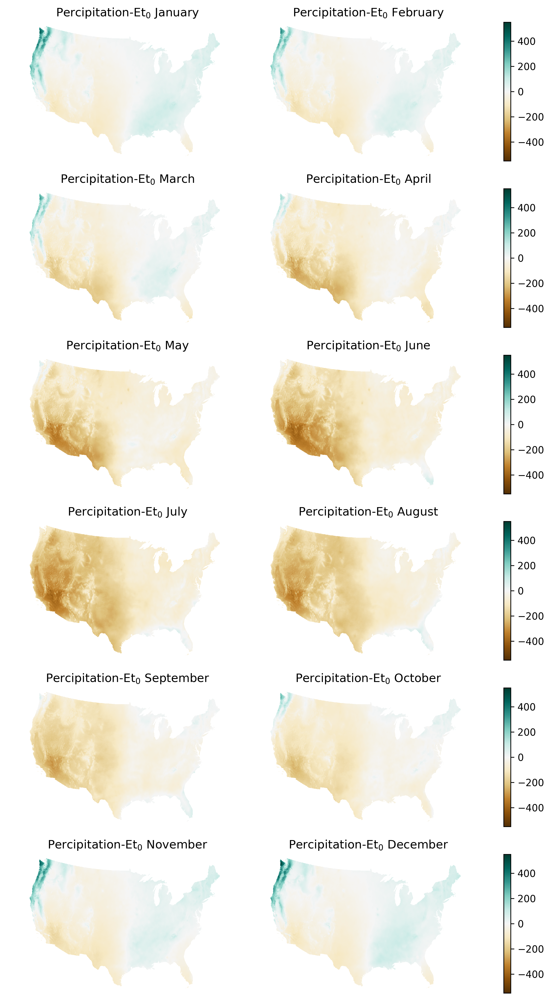

In [138]:
fig, ax = plt.subplots(6,2, figsize=(10, 18), dpi=300)
month_values = [str(month).zfill(2) for month in range(1, 13)] # re init for poping 

for i in range(6): #row
    for j in range(2): #column
        month = month_values.pop(0) # grab the top value off 

        #plot
        conus_delta_data[month].plot(ax=ax[i,j], cmap = 'BrBG', vmin = -550, vmax = 550)
        ax[i,j].set_axis_off()
        ax[i,j].set_title(f'Percipitation-Et$_0$ {month_dict[month]}')
        
#color bars only on right column          
for i in range(12, 18):
    fig.delaxes(fig.axes[i])

plt.subplots_adjust(wspace=-0.2) 

In [18]:
y_data = y_data.dropna()
#y_data

In [19]:
x_data = x_data.dropna()
#x_data

In [20]:
from sklearn.model_selection import train_test_split
from sklearn import metrics

# from DAT 402
n= 10 # number or regression models to build forest with  # one tree was markedly worse [93.6, 9.456] split by month seemed like a save choise
output = []
var_importance = pd.DataFrame()


X_train, X_test, y_train, y_test = train_test_split(x_data, y_data, test_size = 0.2, random_state = 42)


rf_mod = RandomForestRegressor(n_estimators=n, n_jobs = 6)    # n_jobs = n threads or  -1 use all avaible threads, bootstrap on be default 
rf_mod.fit(X_train,y_train)

#dataconversion warning is fine

/home/multivac/jupyter/geo/lib/python3.10/site-packages/sklearn/base.py:1351: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestRegressor(n_estimators=10, n_jobs=6)

### Model Performance 
The random forest model was built on the baseline using values for minimum and maximum temperature, as well as precipitation to predict ET$_0$ values. As those are the values available in the future climate models. Training the model produced the following test statistics.

| Test    | Value  |
| ------- | ------ |
| minimun | 2.91   |
| maximum | 429.94 |
| R$^2$   | 0.95   |
| MAE     | 9.95   |
| RMSE    | 15.9   |


In [21]:
#evaluating Model Preformance
y_pred = rf_mod.predict(X_test)

print(f'min = {y_pred.min()}')
print(f'max = {y_pred.max()}')

print(f'R2 = {rf_mod.score(X_test,y_test)}')
print(f'MAE = {metrics.mean_absolute_error(y_test.values,y_pred)}')  #29.52 = mean length of month
print(f'RMSE = {metrics.root_mean_squared_error(y_test.values, y_pred) }')  

min = 3.08830349445343
max = 429.5318115234375
R2 = 0.9505247723258997
MAE = 9.952752580769511
RMSE = 15.914197044203053


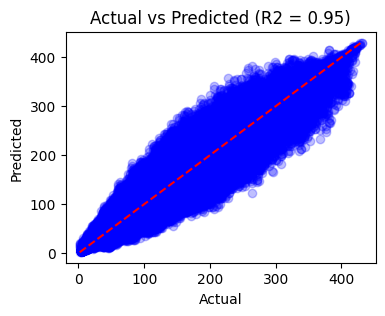

In [83]:
from sklearn.metrics import r2_score
# Calculate R2
r2 = r2_score(y_test, y_pred)

# Scatter plot of actual vs predicted values
plt.figure(figsize=(4, 3))
plt.scatter(y_test, y_pred, color='blue', alpha=0.25)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title(f'Actual vs Predicted (R2 = {r2:.2f})')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
plt.show()


These results are promising, producing a surprisingly good fit and moderate error. The model should preform well enough on future climate models to give us a reasonable approximation of growing conditions under future climate scenarios. 

In [23]:
def get_nass_data(header, add_fips = False):
    
    #Base call:
    call = 'https://quickstats.nass.usda.gov/api/api_GET/' #?key=api key&{parameter ... parameter}&format={json | csv | xml'

    #My API key: Get your own!
    api_key_param = {'key':'C079E1ED-6E4D-3384-B41C-64ACD54327A9 '}

    #Merge the parameters and key:
    parameters = api_key_param.copy()
    parameters.update(header)

    #Use requests.get:
    response = requests.get(call, params=parameters)

    
    #If it worked, do our basic data cleaning and return
    if (response.status_code == 200):
        data_df = pd.DataFrame(response.json()['data'])

        data_df['Value'].loc[data_df['Value'].str.contains('(D)') == True] = ''
        data_df['Value'].loc[data_df['Value'].str.contains('(Z)') == True] = ''

        #Convert to a float if possible, otherwise np.NaN
        data_df['Value'] = data_df['Value'].apply(lambda x: atof(x) if x else np.NaN)
        
        
        #Add FIPS code if county resolution/requested:
        if (add_fips):
            data_df['FIPS'] = data_df['state_fips_code'] + data_df['county_ansi']

        return data_df
    
    #Otherwise raise an exception
    else:
        raise Exception(response.status_code)
        
        return -1

In [24]:
name_list = ['AG LAND, CROPLAND - ACRES',
             'AG LAND, CROPLAND, HARVESTED - ACRES',
             'AG LAND, CROPLAND, HARVESTED, IRRIGATED - ACRES',
             'AG LAND, PASTURELAND - ACRES']

header = {'short_desc': name_list, "agg_level_desc":"COUNTY",
          'source_desc': 'CENSUS', 'domain_desc':'TOTAL', 'year':2017,
          'freq_desc':'ANNUAL', 'reference_period_desc':'YEAR',
          "format":"json"}

df_land = get_nass_data(header, add_fips=True)
#df_land

/tmp/ipykernel_125821/4170059341.py:21: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  data_df['Value'].loc[data_df['Value'].str.contains('(D)') == True] = ''
/tmp/ipykernel_125821/4170059341.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['Value'].loc[data_df['Value'].str.contains('(D)') == True] = ''
/tmp/ipykernel_125821/4170059341.py:22: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  data_df['Value'].loc[data_df['Value'].str.contains('(Z)') == True] = ''
/tmp/ipykernel_125821/4170059341.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docume

In [25]:
### Cleaning 

#Drop missing values 
df_land = df_land.loc[df_land.county_ansi != '']

#Make a dictionary mapping the original names to new names and apply 

name_list = ['AG LAND, CROPLAND - ACRES',
             'AG LAND, CROPLAND, HARVESTED - ACRES',
             'AG LAND, CROPLAND, HARVESTED, IRRIGATED - ACRES',
             'AG LAND, PASTURELAND - ACRES']

rename_list = ['Cropland', 'Harvested', 'Cropland_Irrigated', 'Pasture']

rename_dictionary = {i:j for i,j in zip(name_list, rename_list)}

df_land['short_desc'].replace(rename_dictionary, inplace=True)


# Pivot 
df_land_pivot = df_land.pivot(index='FIPS', columns=['short_desc'], values=['Value']).reset_index()

# get values of second level of multiindex 
df_land_pivot.columns = ['FIPS'] + list(df_land_pivot.columns[1:].get_level_values(1))
#df_land_pivot

/tmp/ipykernel_125821/1002961069.py:17: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_land['short_desc'].replace(rename_dictionary, inplace=True)


In [26]:
gdf_land = county_gdf_5070.merge(df_land_pivot, on='FIPS', how='left')


### Future scenarios 
This plot shows ET$_0$ under our current climate and that of 2061-2080 under our future climate model. Showing increase in values for our reference grass surface across the CONUS.

In [27]:
## Load Data
scale = '2.5m'
f_sources = ['prec','tmax','tmin']
#load files into dict
f_data_dict = {}

for source in f_sources:
    file_name = f'future_data/wc2.1_{scale}_{source}_HadGEM3-GC31-LL_ssp245_2041-2060.tif'
    data = rxr.open_rasterio(file_name, masked=True).squeeze()
    key = f'{source}'

    # Extract dimensions from dataset.sizes
    height = data.sizes['y']
    width = data.sizes['x']

    #clip first
    data = data.rio.clip(state_gdf.geometry.values, state_gdf.crs)  
    #reproject
    data = data.rio.reproject('EPSG:5070')
    
    f_data_dict[key] = data

In [28]:
future_conus_ETo = {}
future_conus_delta = {}
future_ai = {}

for month in range(0,12):
    #grab values to use for predicting ETO
    future_x_data =  pd.concat([pd.DataFrame(f_data_dict['prec'][month].to_series()),pd.DataFrame(f_data_dict['tmin'][month].to_series()),
                                pd.DataFrame(f_data_dict['tmax'][month].to_series()) ],axis =1 )
    #predict the future
    future_ETo = rf_mod.predict(future_x_data)
    
    #get rid of those pesky values outside the conus that were nan
    value_to_replace = future_ETo[0]
    tolerance = 1e-6
    future_ETo[np.isclose(future_ETo, value_to_replace, atol=tolerance)] = np.nan

    #assign back to dataframe,  
    future_x_data['ETo'] = future_ETo #*12

    #finaly convert to xarray
    ETo_future = future_x_data['ETo'].to_xarray()

    #save off (months[month] is to keep the dictonaries formated the same as the others)
    future_conus_ETo[months[month]] = ETo_future
    future_conus_delta[months[month]] = f_data_dict['prec'][month]  - ETo_future
    future_ai[months[month]] = f_data_dict['prec'][month] / ETo_future


#looking at the change in counties with more then 25 percent of land devoted to harvested
## change in percip - eto
i = 0
climate_change_delta = {}
for month in months:
    
    change =  f_data_dict['prec'][i] - conus_delta_data[month] 

    
    change_clip = change.rio.clip(gdf_land[gdf_land['Harvested']/ (gdf_land.ALAND / 4046.86)*100>25].geometry.values, gdf_land.crs)

    climate_change_delta[month] = change_clip

    i += 1
#change in eto
climate_change = {}
for month in months:
    change2 =   future_conus_ETo[month] - conus_ETo_data[month]
    #change = (future_conus_delta[month] - conus_delta_data[month] ) / conus_delta_data[month] 
    
    change_clip2 = change2.rio.clip(gdf_land[gdf_land['Harvested']/ (gdf_land.ALAND / 4046.86)*100>25].geometry.values, gdf_land.crs)

    climate_change[month] = change_clip2

#change in aridity index
#climate_change = {}
#for month in months:
#    change = conus_ETo_data[month] - future_conus_ETo[month]
    #change = (future_conus_delta[month] - conus_delta_data[month] ) / conus_delta_data[month] 
    
 #   change_clip = change.rio.clip(gdf_land[gdf_land['Harvested']/ (gdf_land.ALAND / 4046.86)*100>25].geometry.values, gdf_land.crs)

 #   climate_change[month] = change_clip
    

In [29]:
total_us_future = 0 
total_us = 0

for month in months[3:10]:  
    if month == '03':
        total_us_future = future_conus_ETo[month]
        total_us = conus_ETo_data[month]
    else:
        total_us_future += future_conus_ETo[month]
        total_us += conus_ETo_data[month]

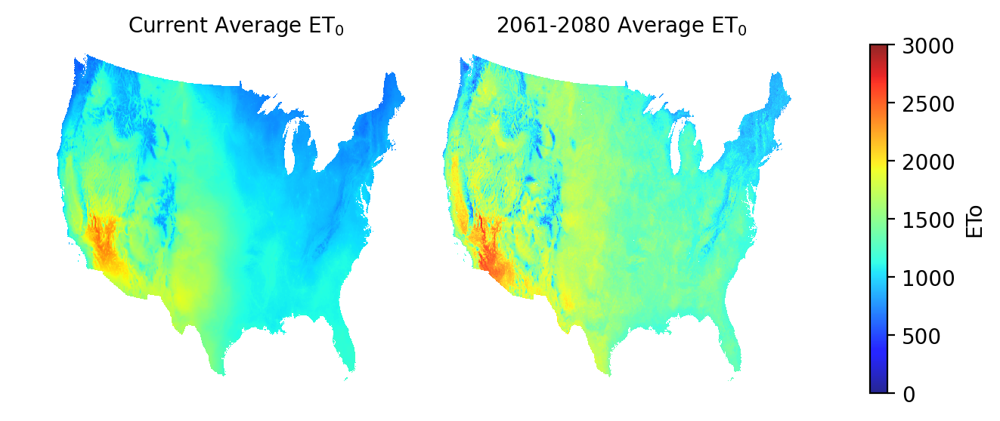

In [90]:
fig, ax1 = plt.subplots(1,2, figsize=(8, 3), dpi=200)


#fig 1
total_us.plot(ax=ax1[0], cmap = 'jet',alpha = .95,vmin = 0,vmax = 3000)
ax1[0].set_axis_off()
ax1[0].set_title('Current Average ET$_0$', fontsize = 10)

#fig 2
total_us_future.plot(ax=ax1[1], cmap = 'jet',alpha = .85,vmin = 0,vmax = 3000)
ax1[1].set_axis_off()
ax1[1].set_title('2061-2080 Average ET$_0$', fontsize = 10)

#touch up
fig.delaxes(fig.axes[2])
plt.subplots_adjust(wspace=-0.3)

### Effect on growing regions 
This figure shows the changes in ET$_0$ for each month (current - future), in counties where at least 25% was harvested. There is an error for the values in January causing very high values, the color map is cropped to 150 so color is not representative for that month. Changes can be seen in our core growing months from June to October where monthly losses due to evapotranspiration can be expected to increase by over 100 mm a month(3.94 in).

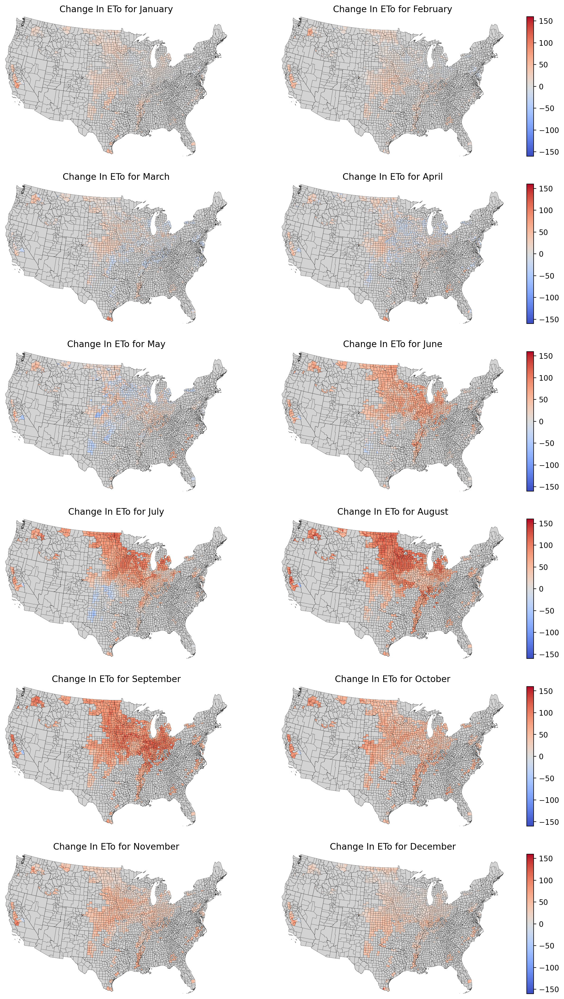

In [129]:
fig, ax = plt.subplots(6,2, figsize=(18, 24), dpi=200)
month_values = [str(month).zfill(2) for month in range(1, 13)] # re init for poping 

for i in range(6): #row
    for j in range(2): #column
        month = month_values.pop(0) # grab the top value off 

        #plot
        state_gdf_5070.plot(ax = ax[i,j], linewidth = .1, edgecolor = 'black', facecolor='lightgrey')
        climate_change[month].plot(ax=ax[i,j], cmap = 'coolwarm', vmin = -160,vmax = 160)
        county_gdf_5070.plot(ax = ax[i,j], linewidth = .1, edgecolor = 'black', facecolor='none')
        ax[i,j].set_axis_off()
        ax[i,j].set_title(f'Change In ETo for {month_dict[month]}')

        
        # Adjust plot limits so its not cliping country because of climate change clip 
        ax[i,j].set_xlim(county_gdf_5070.total_bounds[0], county_gdf_5070.total_bounds[2])
        ax[i,j].set_ylim(county_gdf_5070.total_bounds[1], county_gdf_5070.total_bounds[3])

#color bars only on right column          
for i in range(12, 18):
    fig.delaxes(fig.axes[i])
    
plt.subplots_adjust(wspace=-0.4) 

This figure looks more specifically at the growing regions, over the key months and shows the expected average losses due to increases in evapotranspiration and the min which in this case is the

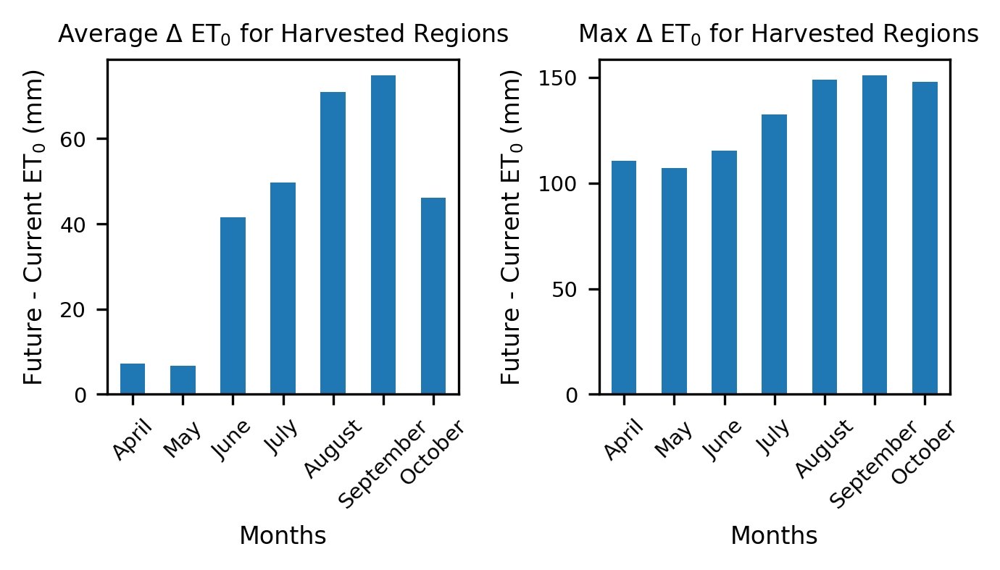

In [105]:
fig, ax1 = plt.subplots(1,2, figsize=(5, 2), dpi=300)

f = 8

mean_values = []
max_values = []
for month in months[3:10]:
    mean_value = climate_change[month].mean().values.item()
    mean_values.append(mean_value)

    max_value = climate_change[month].max().values.item()
    max_values.append(max_value)

mean_climate_ETo = pd.DataFrame(mean_values, index=month_names[3:10])
max_climate_ETo = pd.DataFrame(max_values, index=month_names[3:10])


mean_climate_ETo.plot.bar(ax = ax1[0],legend =False, fontsize = f-1)

#make things pretty
ax1[0].set_xticklabels(ax1[0].get_xticklabels(), rotation=45)
ax1[0].set_xlabel('Months', fontsize = f)
ax1[0].set_ylabel('Future - Current ET$_0$ (mm)', fontsize = f)
ax1[0].set_title("Average $\Delta$ ET$_0$ for Harvested Regions", fontsize = f)



max_climate_ETo.plot.bar(ax = ax1[1],legend =False, fontsize = f-1)

#make things pretty
ax1[1].set_xticklabels(ax1[1].get_xticklabels(), rotation=45)
ax1[1].set_xlabel('Months', fontsize = f)
ax1[1].set_ylabel('Future - Current ET$_0$ (mm)', fontsize = f)
ax1[1].set_title(" Max $\Delta$ ET$_0$ for Harvested Regions", fontsize = f)

plt.subplots_adjust(wspace=0.4) 

As shown it the bellow figure we will not be able to rely on changes in precipitation to make up for the change in evapotranspiration. With a neglagable predicted loss in Precipitation over growing regions (-0.006 mm/acre).

74682270.0
72666320.0
Chnage in percipitation = -0.006342263071689468


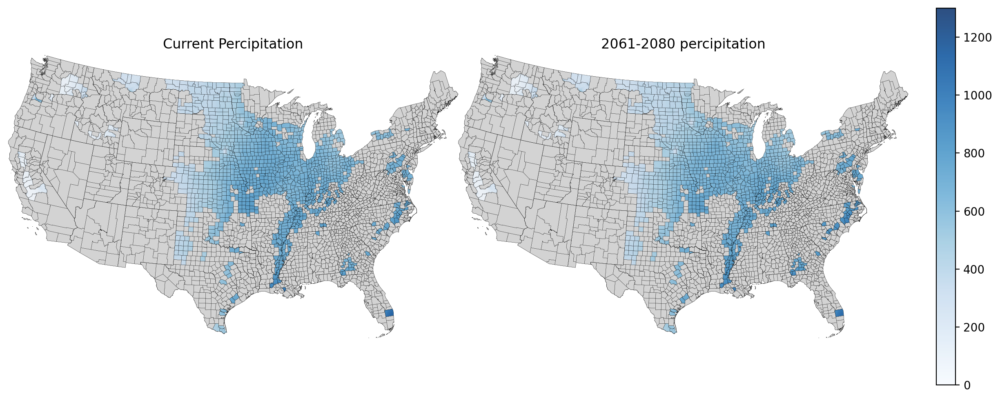

In [108]:
prec_us_future = 0 
prec_us = 0
i = 3
for month in months[3:10]:  
    if month == '03':
        prec_us_future = f_data_dict['prec'][i]
        prec_us = conus_data_dict[f'prec_{month}']
    else:
        prec_us_future += f_data_dict['prec'][i]
        prec_us += conus_data_dict[f'prec_{month}']

    i += 1



fig, ax1 = plt.subplots(1,2, figsize=(16, 6), dpi=200)

prec_us_future = prec_us_future.rio.clip(gdf_land[gdf_land['Harvested']/ (gdf_land.ALAND / 4046.86)*100>25].geometry.values, gdf_land.crs)
prec_us = prec_us.rio.clip(gdf_land[gdf_land['Harvested']/ (gdf_land.ALAND / 4046.86)*100>25].geometry.values, gdf_land.crs)#

print(prec_us.sum().values)
print(prec_us_future.sum().values)
asdf = (prec_us_future.sum().values - prec_us.sum().values)/ gdf_land['Harvested'].sum()
print(f'Chnage in percipitation = {asdf}')

state_gdf_5070.plot(ax = ax1[0], linewidth = .1, edgecolor = 'black', facecolor='lightgrey')
state_gdf_5070.plot(ax = ax1[1], linewidth = .1, edgecolor = 'black', facecolor='lightgrey')


prec_us.plot(ax=ax1[0], cmap = 'Blues',alpha = .85,vmin = 0,vmax = 1300)
ax1[0].set_axis_off()
ax1[0].set_title('Current Percipitation')

#vmin = 0,vmax = 1300
prec_us_future.plot(ax=ax1[1], cmap = 'Blues',alpha = .85,vmin = 0,vmax = 1300)
ax1[1].set_axis_off()
ax1[1].set_title('2061-2080 percipitation')

ax1[0].set_xlim(county_gdf_5070.total_bounds[0], county_gdf_5070.total_bounds[2])
ax1[1].set_xlim(county_gdf_5070.total_bounds[0], county_gdf_5070.total_bounds[2])
ax1[0].set_ylim(county_gdf_5070.total_bounds[1], county_gdf_5070.total_bounds[3])
ax1[1].set_ylim(county_gdf_5070.total_bounds[1], county_gdf_5070.total_bounds[3])


county_gdf_5070.plot(ax = ax1[0], linewidth = .1, edgecolor = 'black', facecolor='none')
county_gdf_5070.plot(ax = ax1[1], linewidth = .1, edgecolor = 'black', facecolor='none')

#touch up
fig.delaxes(fig.axes[2])
plt.subplots_adjust(wspace=-.2)

# Conclusion 

This study attempted to use readily available data and an evapotranspiration model, in order to understand the water demands under future climate scenarios. The use of Random Forest regression showed promise in predicting ET$_0$ values using variables available in future climate models. Results from this model highlight the need for addressing the water demands for crops as part of facing climate change. Further work is merited refining the model and broadening the analysis. 

# Refrences

Allen et al. Crop evapotranspiration —guidelines for computing crop water requirements. FAO Irrigation and drainage paper 56. Food and Agriculture Organization, Rome (1998).

McColl, Kaighin A. “Practical and Theoretical Benefits of an Alternative to the Penman‐Monteith Evapotranspiration Equation.” _Water Resources Research_ 56, no. 6 (June 2020): e2020WR027106. [https://doi.org/10.1029/2020WR027106](https://doi.org/10.1029/2020WR027106).

Zomer, R.J., Xu, J. & Trabucco, A. Version 3 of the Global Aridity Index and Potential Evapotranspiration Database. _Sci Data_ **9**, 409 (2022). https://doi.org/10.1038/s41597-022-01493-1

Shi, Lijie, Puyu Feng, Bin Wang, De Li Liu, James Cleverly, Quanxiao Fang, and Qiang Yu.  Projecting Potential Evapotranspiration Change and Quantifying Its Uncertainty under Future Climate Scenarios: A Case Study in Southeastern Australia. Journal of Hydrology 584 (May 2020): 124756. https://doi.org/10.1016/j.jhydrol.2020.124756

Allen, Richard G., Masahiro Tasumi, and Ricardo Trezza. Satellite-Based Energy Balance for Mapping Evapotranspiration with Internalized Calibration (METRIC) Model.Journal of Irrigation and Drainage Engineering 133, no. 4 (August 2007): 380 94. https://doi.org/10.1061/(ASCE)0733-9437(2007)133:4(380)
